In [36]:
import pandas as pd

# CSV file ka path specify karo (Agar file same folder me hai to sirf file ka naam likho)
file_path = "train_BRCpofr.csv"  # Apni file ka actual naam likho

# Dataset load karo
df = pd.read_csv(file_path)

# Pehli 5 rows check karo
print(df.head())

# Columns ka naam check karo
print(df.columns)


   id  gender   area qualification         income  marital_status  vintage  \
0   1    Male  Urban      Bachelor         5L-10L               1        5   
1   2    Male  Rural   High School         5L-10L               0        8   
2   3    Male  Urban      Bachelor         5L-10L               1        8   
3   4  Female  Rural   High School         5L-10L               0        7   
4   5    Male  Urban   High School  More than 10L               1        6   

   claim_amount num_policies policy type_of_policy    cltv  
0          5790  More than 1      A       Platinum   64308  
1          5080  More than 1      A       Platinum  515400  
2          2599  More than 1      A       Platinum   64212  
3             0  More than 1      A       Platinum   97920  
4          3508  More than 1      A           Gold   59736  
Index(['id', 'gender', 'area', 'qualification', 'income', 'marital_status',
       'vintage', 'claim_amount', 'num_policies', 'policy', 'type_of_policy',
       'clt

In [37]:
print(df.columns)  # Check all column names

Index(['id', 'gender', 'area', 'qualification', 'income', 'marital_status',
       'vintage', 'claim_amount', 'num_policies', 'policy', 'type_of_policy',
       'cltv'],
      dtype='object')


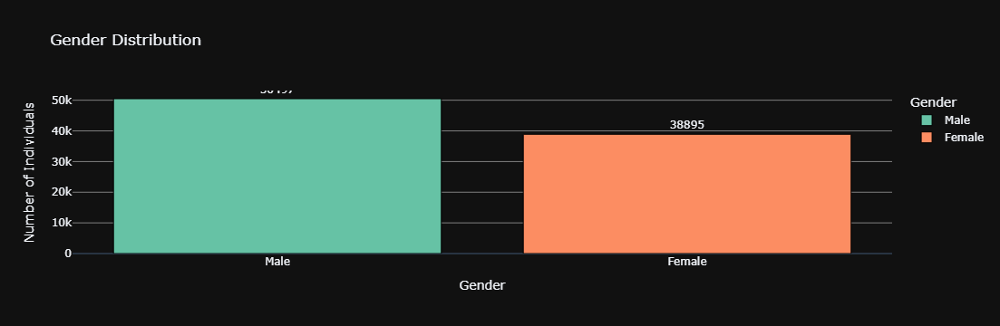

In [38]:
import plotly.express as px

# Count gender occurrences
gender_counts = df['gender'].value_counts().reset_index()
gender_counts.columns = ['Gender', 'Count']

# Create an interactive bar chart
fig = px.bar(
    gender_counts,
    x="Gender",
    y="Count",
    color="Gender",
    text="Count",
    title="Gender Distribution",
    labels={"Gender": "Gender", "Count": "Number of Individuals"},
    color_discrete_sequence=px.colors.qualitative.Set2,
)

# Customize text annotations and layout
fig.update_traces(
    texttemplate='%{text}', 
    textposition='outside', 
    marker=dict(line=dict(color='black', width=1))
)

fig.update_layout(
    template="plotly_dark", 
    xaxis=dict(showgrid=False), 
    yaxis=dict(showgrid=True, gridcolor="gray"), 
    height=500
)

fig.show()


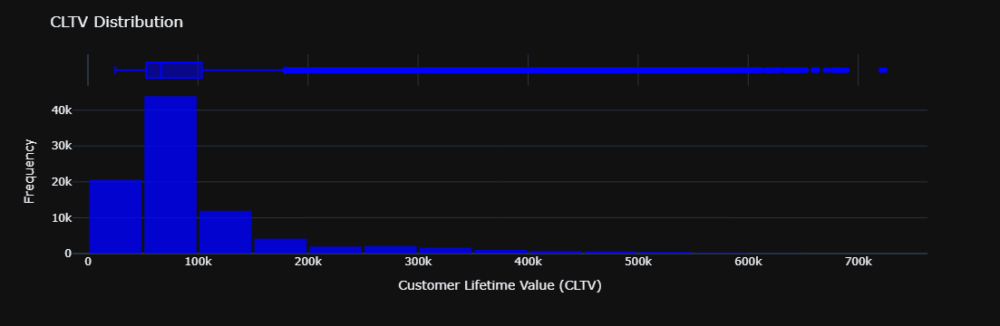

In [39]:
import plotly.express as px

# Create an interactive histogram for CLTV Distribution
fig = px.histogram(
    df, x="cltv", nbins=30, marginal="box", opacity=0.8, color_discrete_sequence=["blue"]
)

# Update layout for better readability
fig.update_layout(
    title="CLTV Distribution",
    xaxis_title="Customer Lifetime Value (CLTV)",
    yaxis_title="Frequency",
    template="plotly_dark",
    bargap=0.05
)

# Show the interactive plot
fig.show()


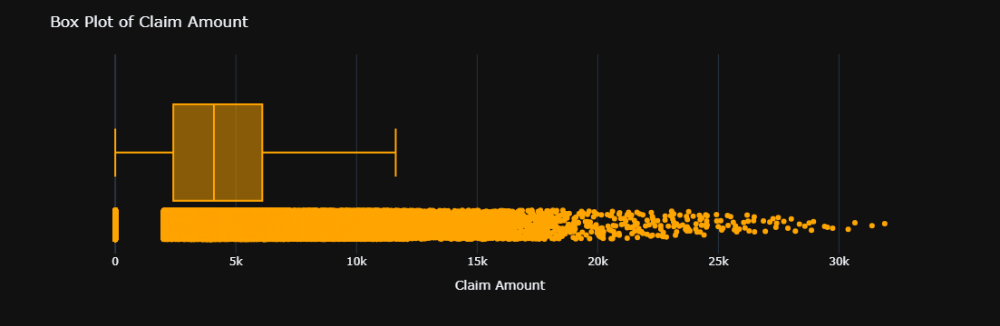

In [40]:
import plotly.express as px

# Create an interactive box plot for Claim Amount
fig = px.box(
    df, 
    x="claim_amount", 
    points="all",  # Show all outliers
    color_discrete_sequence=["orange"]
)

# Update layout for better readability
fig.update_layout(
    title="Box Plot of Claim Amount",
    xaxis_title="Claim Amount",
    template="plotly_dark",
    showlegend=False
)

# Show the interactive plot
fig.show()


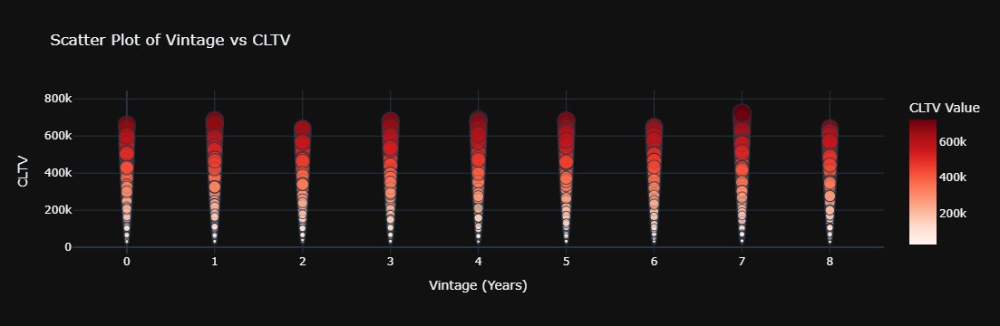

In [41]:
import plotly.express as px

# Create an interactive scatter plot for Vintage vs CLTV
fig = px.scatter(
    df, 
    x="vintage", 
    y="cltv", 
    color="cltv",  # Color based on CLTV values
    size="cltv",  # Bubble size based on CLTV
    opacity=0.7,  # Slight transparency for better visualization
    color_continuous_scale="reds",  # Red gradient for CLTV
    title="Scatter Plot of Vintage vs CLTV"
)

# Update layout for better presentation
fig.update_layout(
    xaxis_title="Vintage (Years)",
    yaxis_title="CLTV",
    template="plotly_dark",
    coloraxis_colorbar_title="CLTV Value"
)

# Show interactive plot
fig.show()


In [2]:
import pandas as pd

# Load your dataset (update file path accordingly)
df = pd.read_csv("train_BRCpofr.csv")  

# Check first few rows
print(df.head())


   id  gender   area qualification         income  marital_status  vintage  \
0   1    Male  Urban      Bachelor         5L-10L               1        5   
1   2    Male  Rural   High School         5L-10L               0        8   
2   3    Male  Urban      Bachelor         5L-10L               1        8   
3   4  Female  Rural   High School         5L-10L               0        7   
4   5    Male  Urban   High School  More than 10L               1        6   

   claim_amount num_policies policy type_of_policy    cltv  
0          5790  More than 1      A       Platinum   64308  
1          5080  More than 1      A       Platinum  515400  
2          2599  More than 1      A       Platinum   64212  
3             0  More than 1      A       Platinum   97920  
4          3508  More than 1      A           Gold   59736  


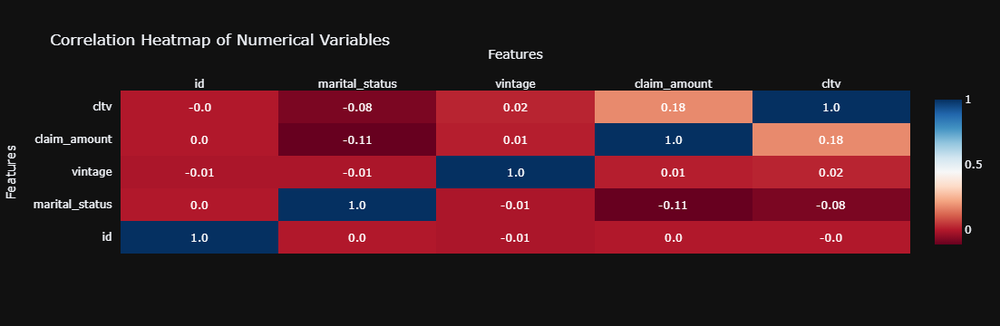

In [3]:
import plotly.figure_factory as ff

# Select numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64'])

# Compute correlation matrix
corr_matrix = numeric_cols.corr().round(2)

# Create an interactive heatmap
fig = ff.create_annotated_heatmap(
    z=corr_matrix.values, 
    x=corr_matrix.columns.tolist(), 
    y=corr_matrix.columns.tolist(), 
    colorscale="RdBu", 
    showscale=True
)

# Update layout for better readability
fig.update_layout(
    title="Correlation Heatmap of Numerical Variables",
    xaxis=dict(title="Features"),
    yaxis=dict(title="Features"),
    template="plotly_dark"
)

# Show interactive plot
fig.show()
